
## 2. Image Segmentation
a. https://huggingface.co/mattmdjaga/segformer_b2_clothes

In [18]:
from transformers import SegformerImageProcessor, AutoModelForSemanticSegmentation
from PIL import Image
import requests
import matplotlib.pyplot as plt
import torch.nn as nn
import pandas as pd
import numpy as np

In [2]:
DATA_DIR = "/mnt/c/Users/james/Downloads/kaggle_clothing/fashion-dataset/"

In [3]:
processor = SegformerImageProcessor.from_pretrained("mattmdjaga/segformer_b2_clothes")


/home/james/anaconda3/envs/matchmylook_env/lib/python3.11/site-packages/transformers/models/segformer/image_processing_segformer.py:99: FutureWarning: The `reduce_labels` parameter is deprecated and will be removed in a future version. Please use `do_reduce_labels` instead.
  warnings.warn(


In [4]:
model = AutoModelForSemanticSegmentation.from_pretrained("mattmdjaga/segformer_b2_clothes")


In [5]:
images_df = pd.read_csv(DATA_DIR+"images.csv")

In [6]:
images_df.head(n=1)

,filename,link
0,15970.jpg,http://assets.myntassets.com/v1/images/style/p...


In [7]:
image = Image.open(requests.get(images_df["link"].loc[0], stream=True).raw)
inputs = processor(images=image, return_tensors="pt")

In [16]:
image.shape()

AttributeError: shape

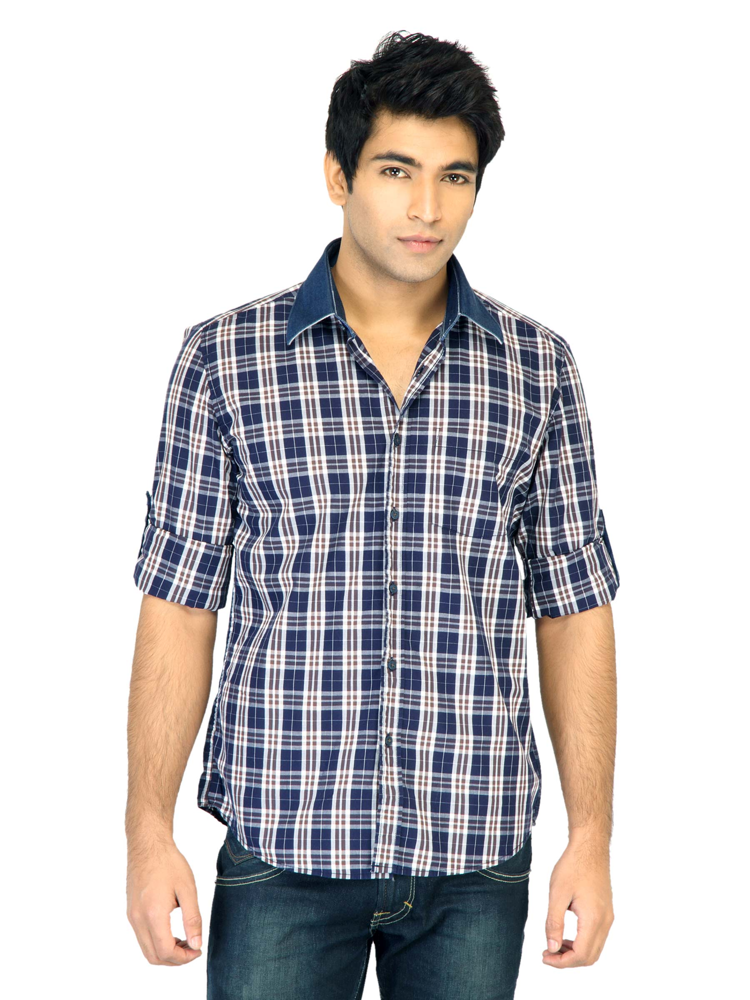

In [14]:
image

In [8]:
outputs = model(**inputs)
logits = outputs.logits.cpu()

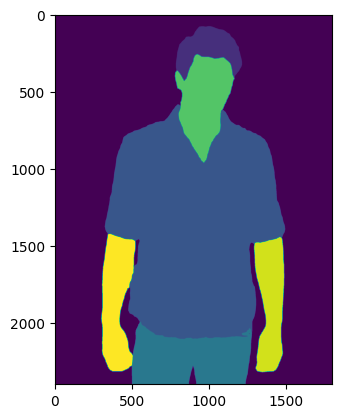

In [9]:
upsampled_logits = nn.functional.interpolate(
    logits,
    size=image.size[::-1],
    mode="bilinear",
    align_corners=False,
)

pred_seg = upsampled_logits.argmax(dim=1)[0]
plt.imshow(pred_seg)

In [11]:
pred_seg.shape

torch.Size([2400, 1800])

In [19]:
orig_arr = np.asarray(image)

In [21]:
orig_arr.shape

(2400, 1800, 3)

### White Out All Pixels But 'Upper-clothes'
* Need to use segmentation mask instead of manual

In [22]:
Labels ={ 0: "Background", 1: "Hat", 2: "Hair", 3: "Sunglasses", 4: "Upper-clothes", 5: "Skirt", 6: "Pants", 7: "Dress", 8: "Belt", 9: "Left-shoe", 10: "Right-shoe", 11: "Face", 12: "Left-leg", 13: "Right-leg", 14: "Left-arm", 15: "Right-arm", 16: "Bag", 17: "Scarf"}

In [ ]:
top_mask = pred_seg[pred_seg]

In [ ]:
#for i in range()

In [ ]:
pred_seg[1500,1000]

tensor(4)

In [35]:
new_arr[pred_seg!=4] = [255,255,255]

In [23]:
orig_arr = np.asarray(image)

In [25]:
new_arr = orig_arr.copy()

In [36]:
new_arr[pred_seg!=4] = [255,255,255]

In [37]:
new_image = Image.fromarray(new_arr)

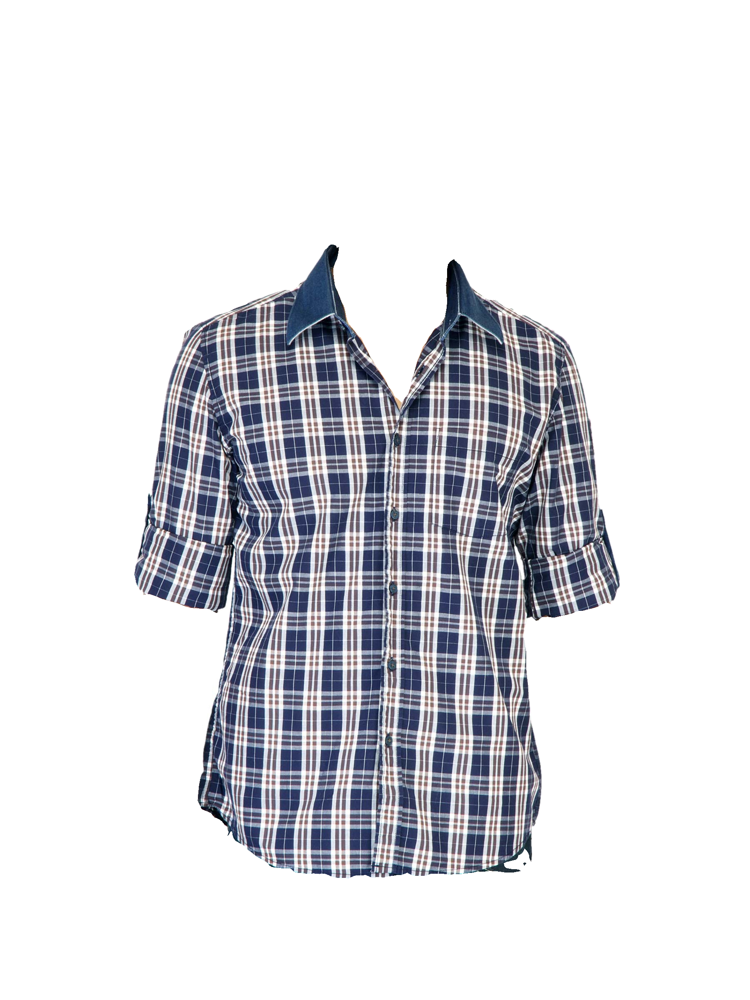

In [39]:
new_image

In [26]:
new_arr[1500,1000]

array([83, 73, 97], dtype=uint8)

In [28]:
np.array([83, 73, 97]) == new_arr[1500,1000]

array([ True,  True,  True])

In [30]:
for i in range(pred_seg.shape[0]):
    for j in range(pred_seg.shape[1]):
        if pred_seg[i,j] != 4:
            new_arr[i,j] = np.array([255,255,255])


In [32]:
new_image = Image.fromarray(new_arr)

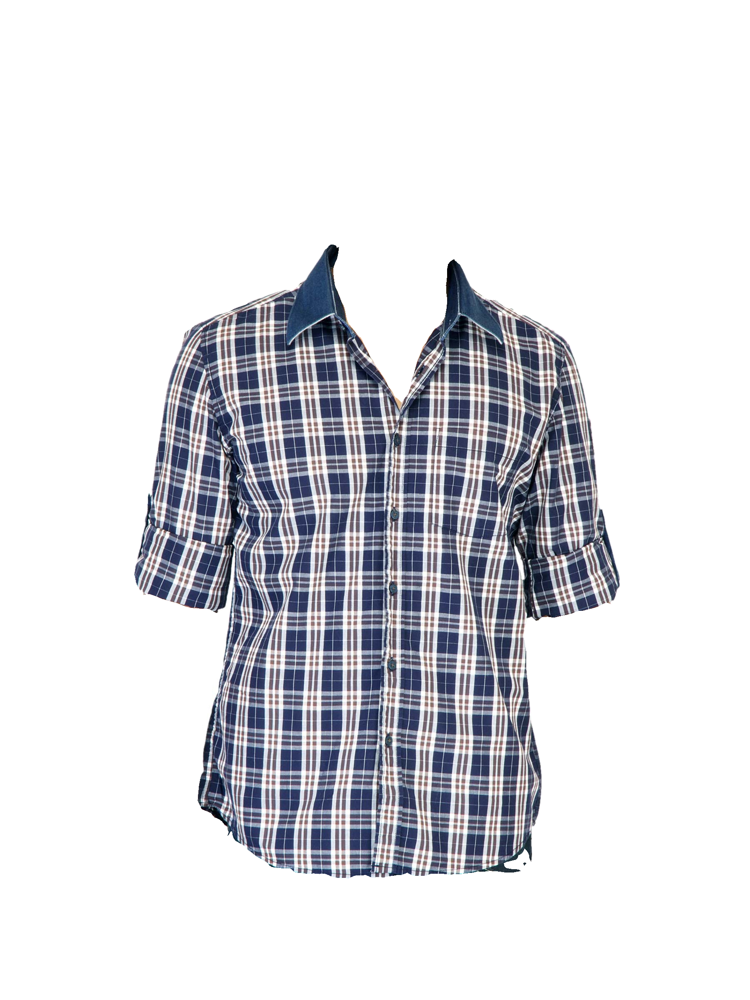

In [33]:
new_image